# Regression
Regression is a Supervised Learning Algorithm. It is used to predict the output value based on the input values.

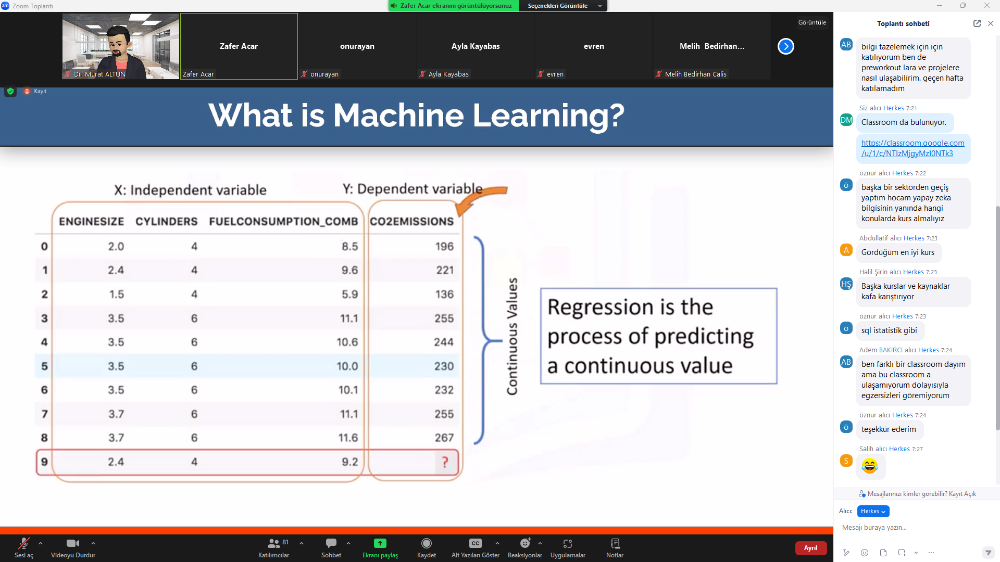

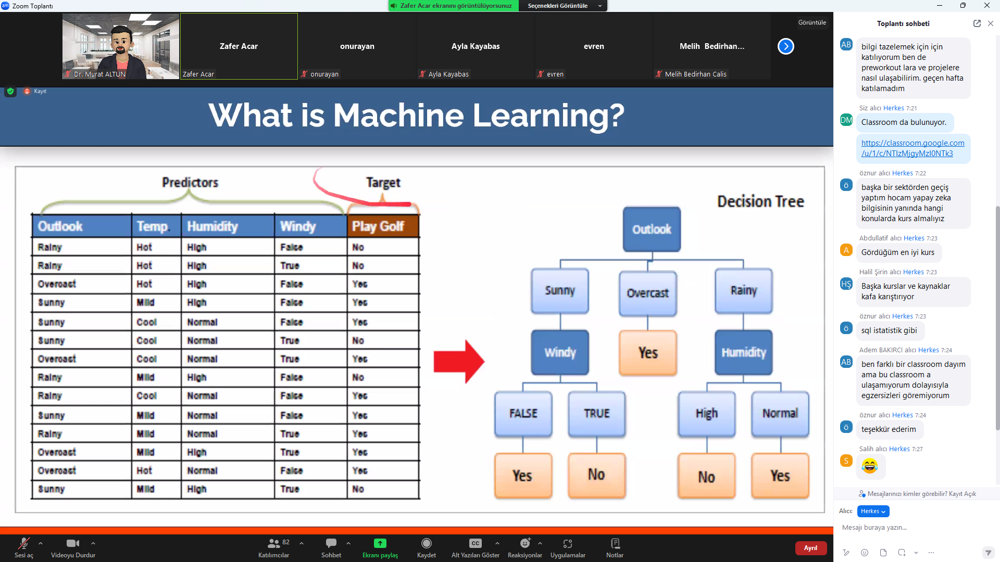

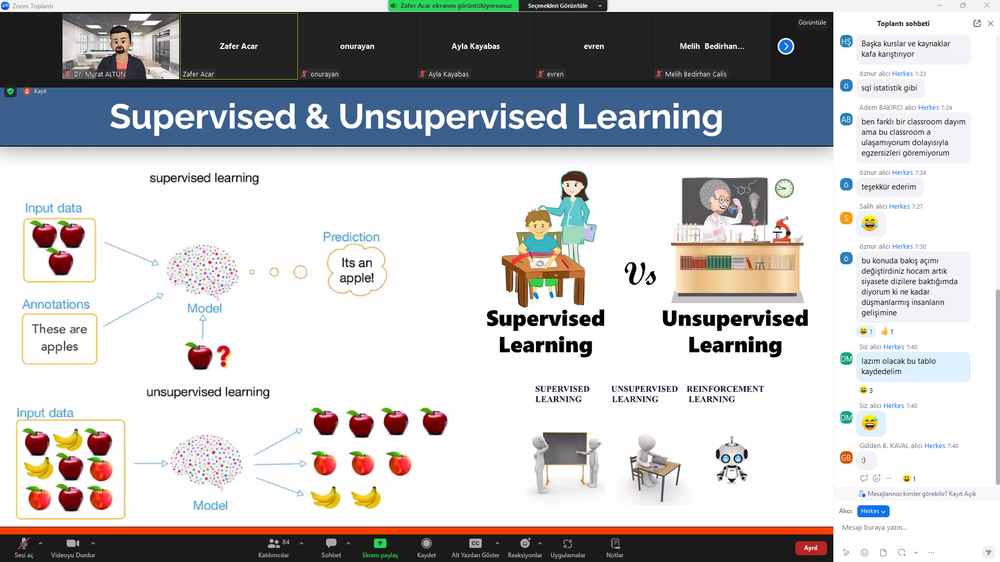

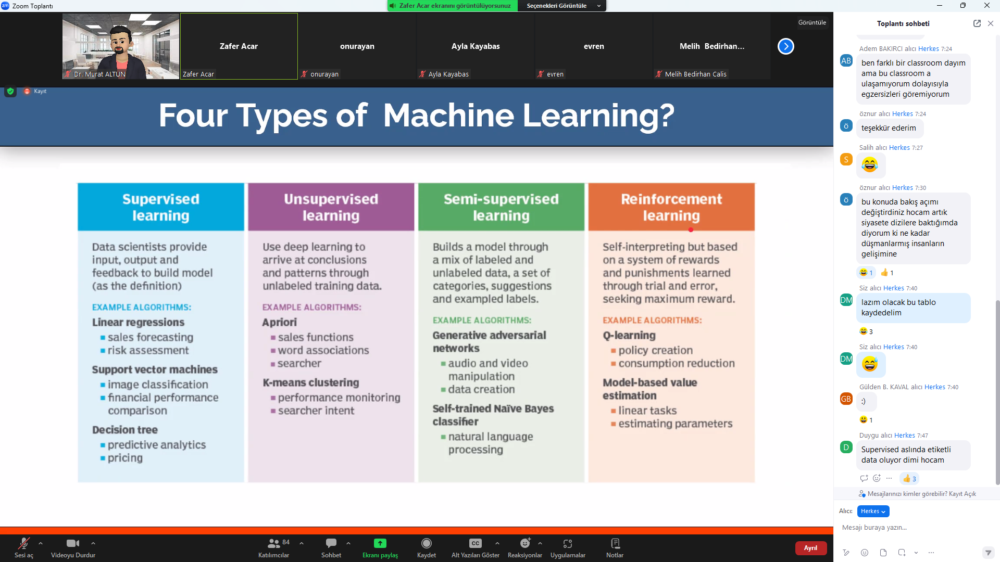

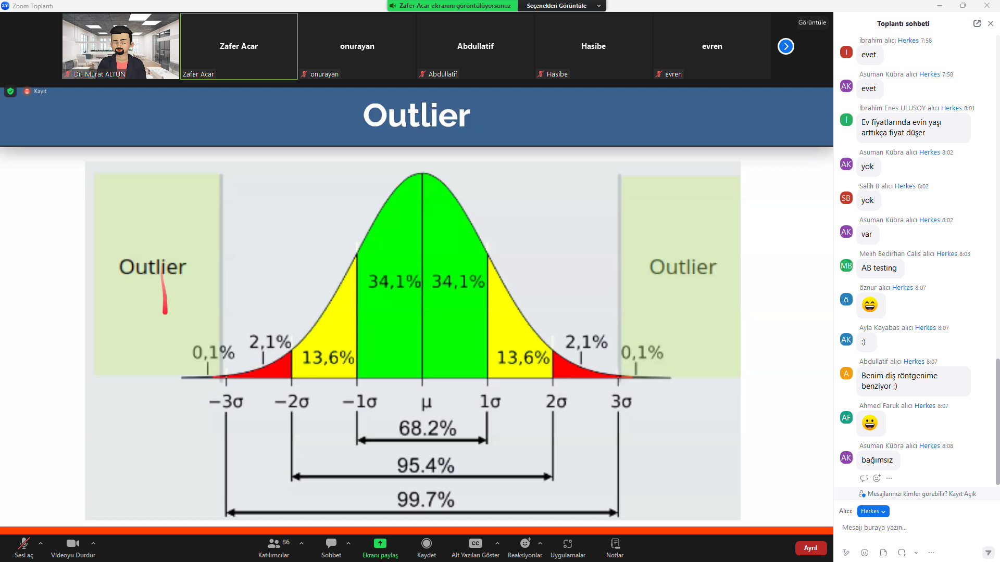

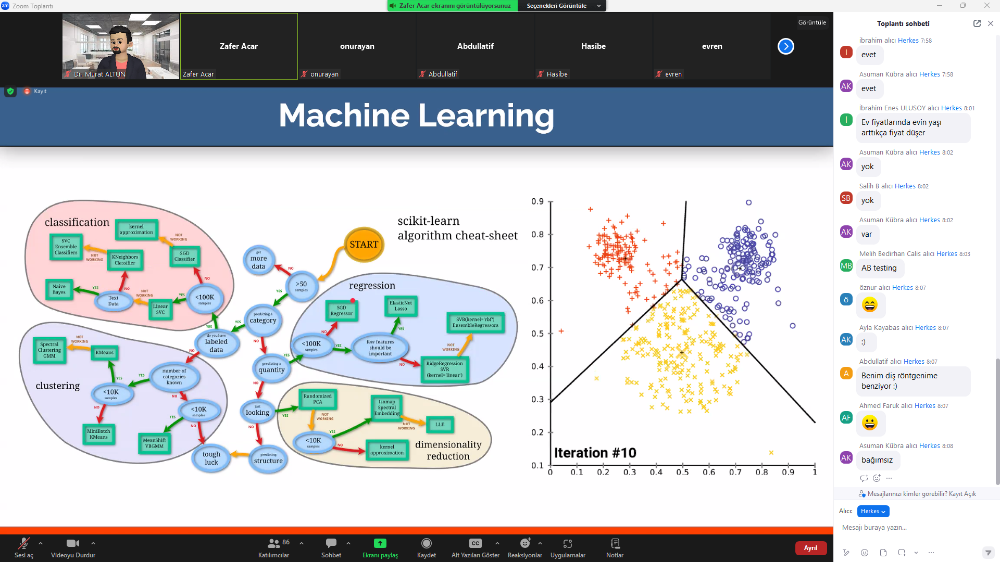

In [1]:
#1000 satır veri olmalı en az

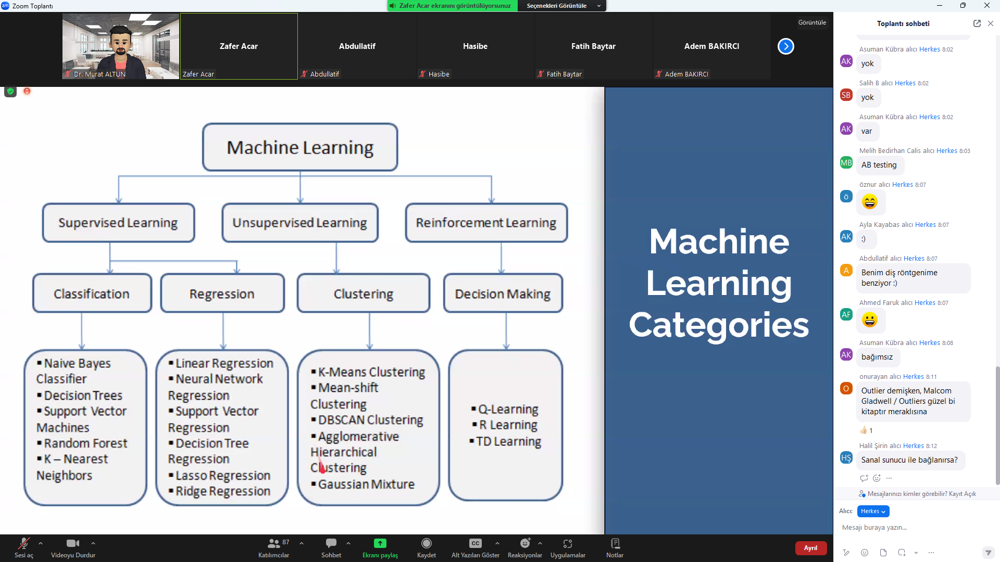

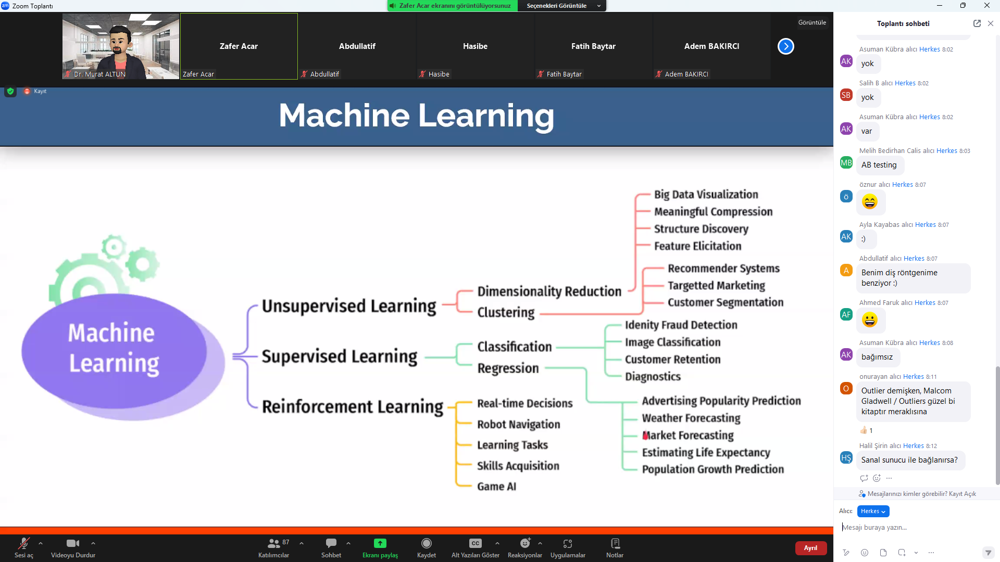

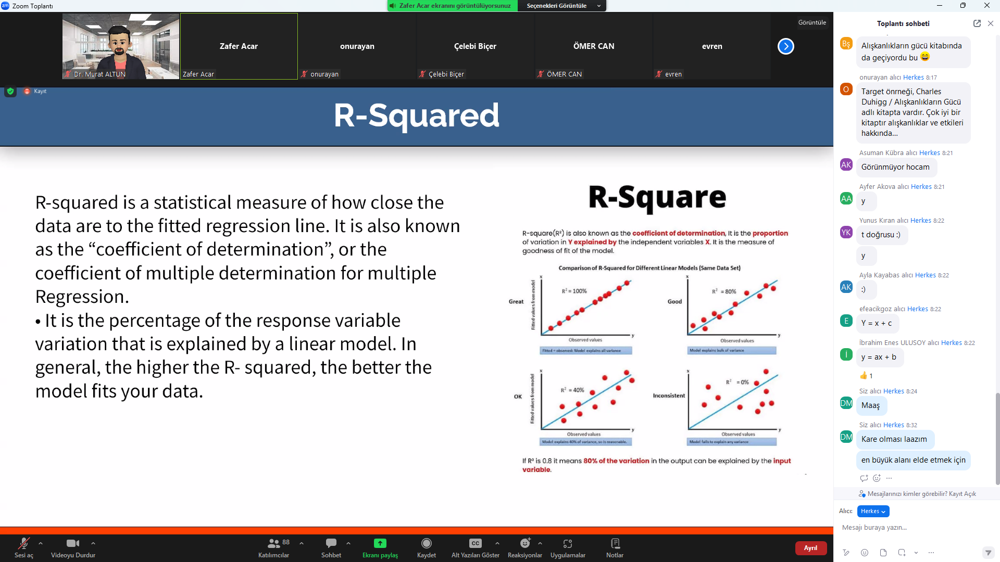

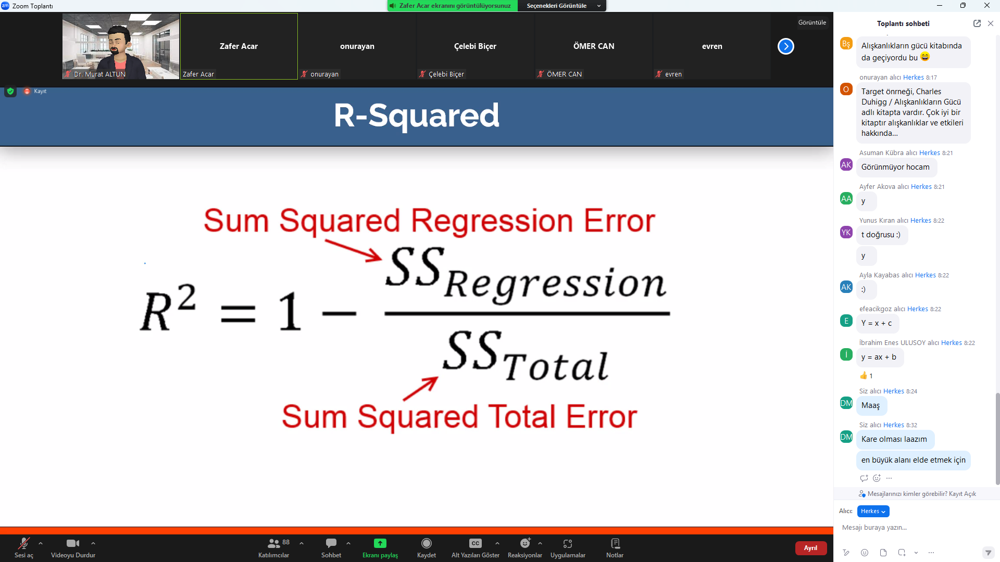

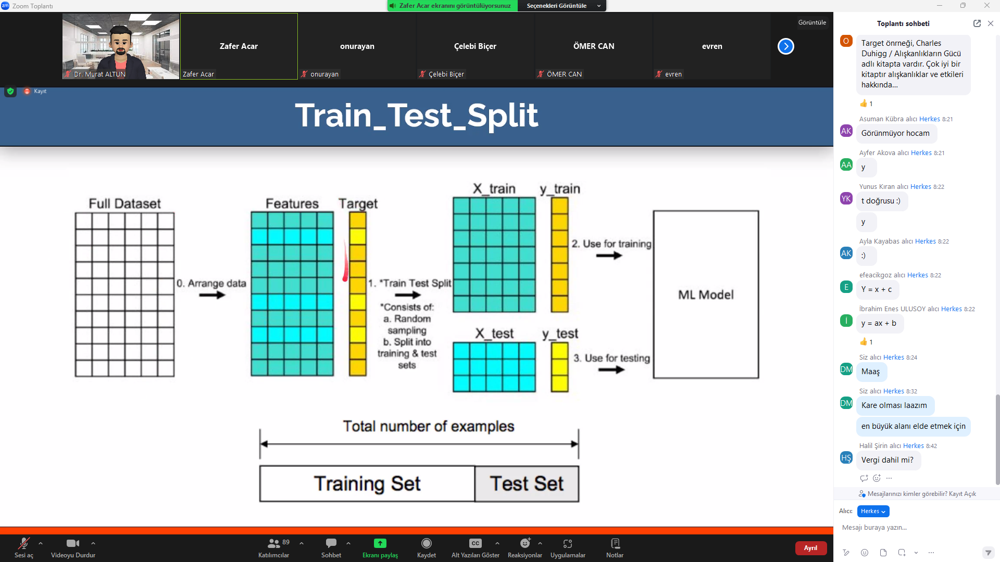

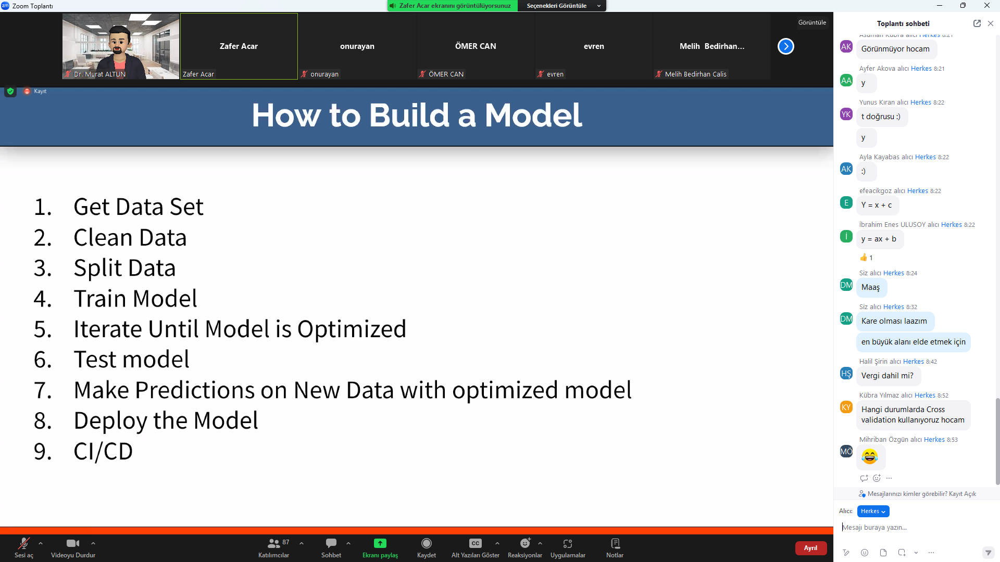

In [2]:
#pip install -q xldr #for read data from excel

In [3]:
import pandas as pd

In [4]:
df=pd.read_excel("cars.xls")

# EDA-Exploratory Data Analysis

In [5]:
df.head()

,Price,Mileage,Make,Model,Trim,Type,Cylinder,Liter,Doors,Cruise,Sound,Leather
0,17314.103129,8221,Buick,Century,Sedan 4D,Sedan,6,3.1,4,1,1,1
1,17542.036083,9135,Buick,Century,Sedan 4D,Sedan,6,3.1,4,1,1,0
2,16218.847862,13196,Buick,Century,Sedan 4D,Sedan,6,3.1,4,1,1,0
3,16336.913140,16342,Buick,Century,Sedan 4D,Sedan,6,3.1,4,1,0,0
4,16339.170324,19832,Buick,Century,Sedan 4D,Sedan,6,3.1,4,1,0,1


In [6]:
    #Columns price: fiyat, mileage: km, make: marka,model: model, trim: alt model, body: kasa, type: tip 

In [7]:
df.shape #rows, columns

(804, 12)

In [8]:
df.sample(5)#random sample 5 rows

,Price,Mileage,Make,Model,Trim,Type,Cylinder,Liter,Doors,Cruise,Sound,Leather
371,18835.189761,8211,Chevrolet,Impala,Sedan 4D,Sedan,6,3.8,4,1,0,1
129,31059.181027,27544,Cadillac,Deville,Sedan 4D,Sedan,8,4.6,4,1,1,1
482,23578.164861,19148,Pontiac,Bonneville,GXP Sedan 4D,Sedan,8,4.6,4,1,0,1
730,30959.932133,17673,SAAB,9_5 HO,Aero Wagon 4D,Wagon,4,2.3,4,1,1,1
282,13540.041642,17343,Chevrolet,Classic,Sedan 4D,Sedan,4,2.2,4,0,1,1


In [9]:
df.info() #data types

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 804 entries, 0 to 803
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Price     804 non-null    float64
 1   Mileage   804 non-null    int64  
 2   Make      804 non-null    object 
 3   Model     804 non-null    object 
 4   Trim      804 non-null    object 
 5   Type      804 non-null    object 
 6   Cylinder  804 non-null    int64  
 7   Liter     804 non-null    float64
 8   Doors     804 non-null    int64  
 9   Cruise    804 non-null    int64  
 10  Sound     804 non-null    int64  
 11  Leather   804 non-null    int64  
dtypes: float64(2), int64(6), object(4)
memory usage: 75.5+ KB


In [10]:
df.describe()#statistics

,Price,Mileage,Cylinder,Liter,Doors,Cruise,Sound,Leather
count,804.000000,804.000000,804.000000,804.000000,804.000000,804.000000,804.000000,804.000000
mean,21343.143767,19831.934080,5.268657,3.037313,3.527363,0.752488,0.679104,0.723881
std,9884.852801,8196.319707,1.387531,1.105562,0.850169,0.431836,0.467111,0.447355
min,8638.930895,266.000000,4.000000,1.600000,2.000000,0.000000,0.000000,0.000000
25%,14273.073870,14623.500000,4.000000,2.200000,4.000000,1.000000,0.000000,0.000000
50%,18024.995019,20913.500000,6.000000,2.800000,4.000000,1.000000,1.000000,1.000000
75%,26717.316636,25213.000000,6.000000,3.800000,4.000000,1.000000,1.000000,1.000000
max,70755.466717,50387.000000,8.000000,6.000000,4.000000,1.000000,1.000000,1.000000


In [11]:
df.corr()

C:\Users\emura\AppData\Local\Temp\ipykernel_19696\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Price,Mileage,Cylinder,Liter,Doors,Cruise,Sound,Leather
Price,1.000000,-0.143051,0.569086,0.558146,-0.138750,0.430851,-0.124348,0.157197
Mileage,-0.143051,1.000000,-0.029461,-0.018641,-0.016944,0.025037,-0.026146,0.001005
Cylinder,0.569086,-0.029461,1.000000,0.957897,0.002206,0.354285,-0.089704,0.075520
Liter,0.558146,-0.018641,0.957897,1.000000,-0.079259,0.377509,-0.065527,0.087332
Doors,-0.138750,-0.016944,0.002206,-0.079259,1.000000,-0.047674,-0.062530,-0.061969
Cruise,0.430851,0.025037,0.354285,0.377509,-0.047674,1.000000,-0.091730,-0.070573
Sound,-0.124348,-0.026146,-0.089704,-0.065527,-0.062530,-0.091730,1.000000,0.165444
Leather,0.157197,0.001005,0.075520,0.087332,-0.061969,-0.070573,0.165444,1.000000


In [12]:
#corr beetween .20-.90

C:\Users\emura\AppData\Local\Temp\ipykernel_19696\3723671215.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),annot=True)


<Axes: >

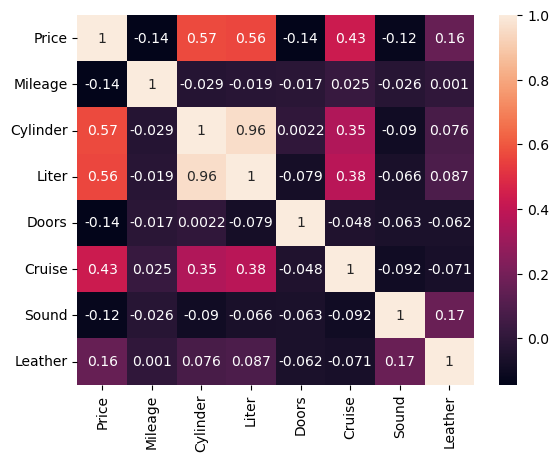

In [13]:
import seaborn as sns
sns.heatmap(df.corr(),annot=True)


In [14]:
#outliers: mean -3*st - mean + 3*std

In [16]:
df.Price.mean(), df.Price.max(), df.Price.min(),df.Price.std()

(21343.143767325837, 70755.46671654288, 8638.930895260657, 9884.852800898007)

In [20]:
df.tail()#last 5

,Price,Mileage,Make,Model,Trim,Type,Cylinder,Liter,Doors,Cruise,Sound,Leather
799,16507.070267,16229,Saturn,L Series,L300 Sedan 4D,Sedan,6,3.0,4,1,0,0
800,16175.957604,19095,Saturn,L Series,L300 Sedan 4D,Sedan,6,3.0,4,1,1,0
801,15731.132897,20484,Saturn,L Series,L300 Sedan 4D,Sedan,6,3.0,4,1,1,0
802,15118.893228,25979,Saturn,L Series,L300 Sedan 4D,Sedan,6,3.0,4,1,1,0
803,13585.636802,35662,Saturn,L Series,L300 Sedan 4D,Sedan,6,3.0,4,1,0,0


In [22]:
df.isnull().sum()#null values

Price       0
Mileage     0
Make        0
Model       0
Trim        0
Type        0
Cylinder    0
Liter       0
Doors       0
Cruise      0
Sound       0
Leather     0
dtype: int64

In [23]:
df.isnull().any() #any null

Price       False
Mileage     False
Make        False
Model       False
Trim        False
Type        False
Cylinder    False
Liter       False
Doors       False
Cruise      False
Sound       False
Leather     False
dtype: bool

In [26]:
df.Make.unique() #unique categories

array(['Buick', 'Cadillac', 'Chevrolet', 'Pontiac', 'SAAB', 'Saturn'],
      dtype=object)

In [33]:
df.Make.nunique() #number of unique categories

6

In [35]:
#df['Make'].value_counts()
df.Make.value_counts() #frequency of each category

Chevrolet    320
Pontiac      150
SAAB         114
Buick         80
Cadillac      80
Saturn        60
Name: Make, dtype: int64

In [38]:
df.Make.value_counts(normalize=True)

Chevrolet    0.398010
Pontiac      0.186567
SAAB         0.141791
Buick        0.099502
Cadillac     0.099502
Saturn       0.074627
Name: Make, dtype: float64

<Axes: xlabel='Make', ylabel='count'>

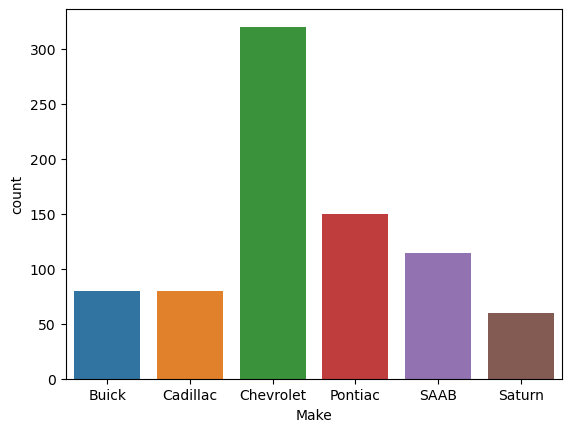

In [42]:
sns.countplot(x=df.Make)

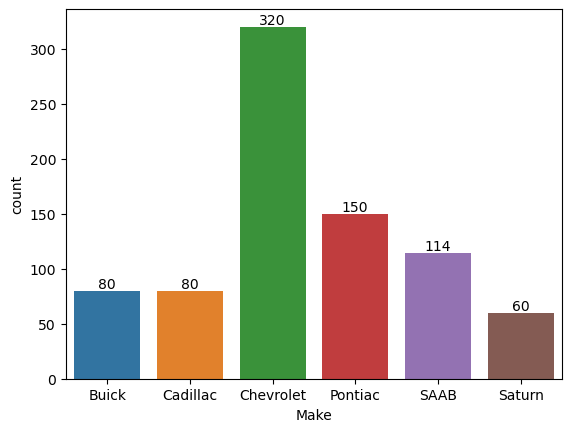

In [45]:
ax=sns.countplot(x=df.Make)
ax.bar_label(ax.containers[0]); #; for no new line

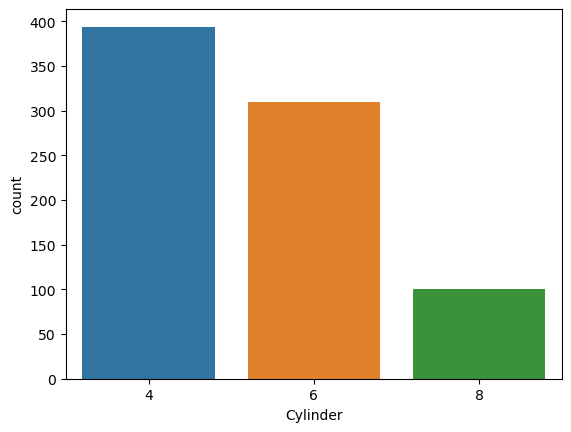

In [46]:
sns.countplot(x=df.Cylinder)
ax.bar_label(ax.containers[0]);

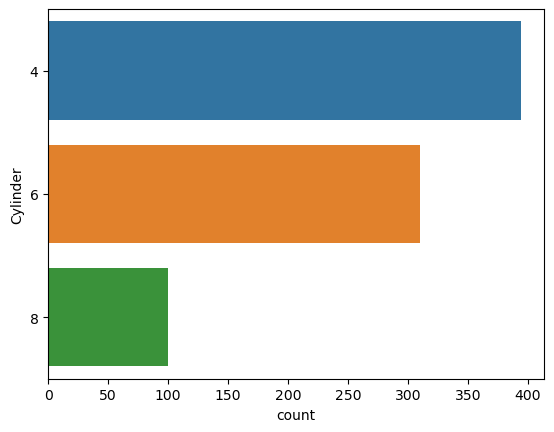

In [48]:
sns.countplot(y=df.Cylinder); # for vertical

<Axes: xlabel='Doors', ylabel='count'>

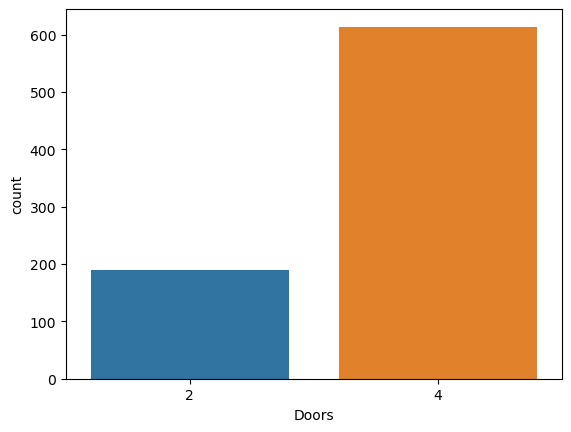

In [52]:
sns.countplot(x=df['Doors'])

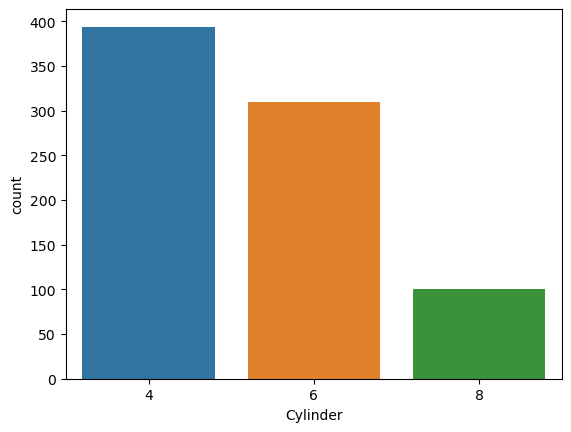

In [91]:
sns.countplot(x=df['Cylinder']);

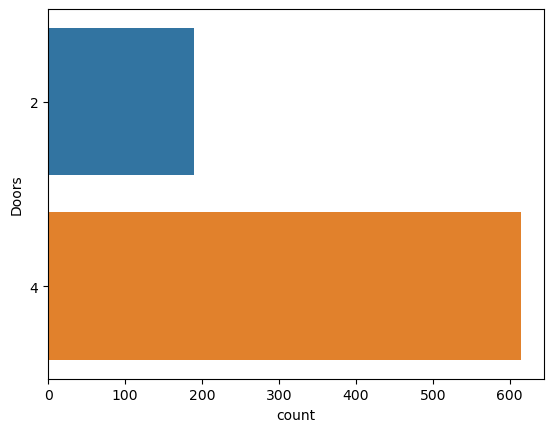

In [92]:
sns.countplot(y=df['Doors']);

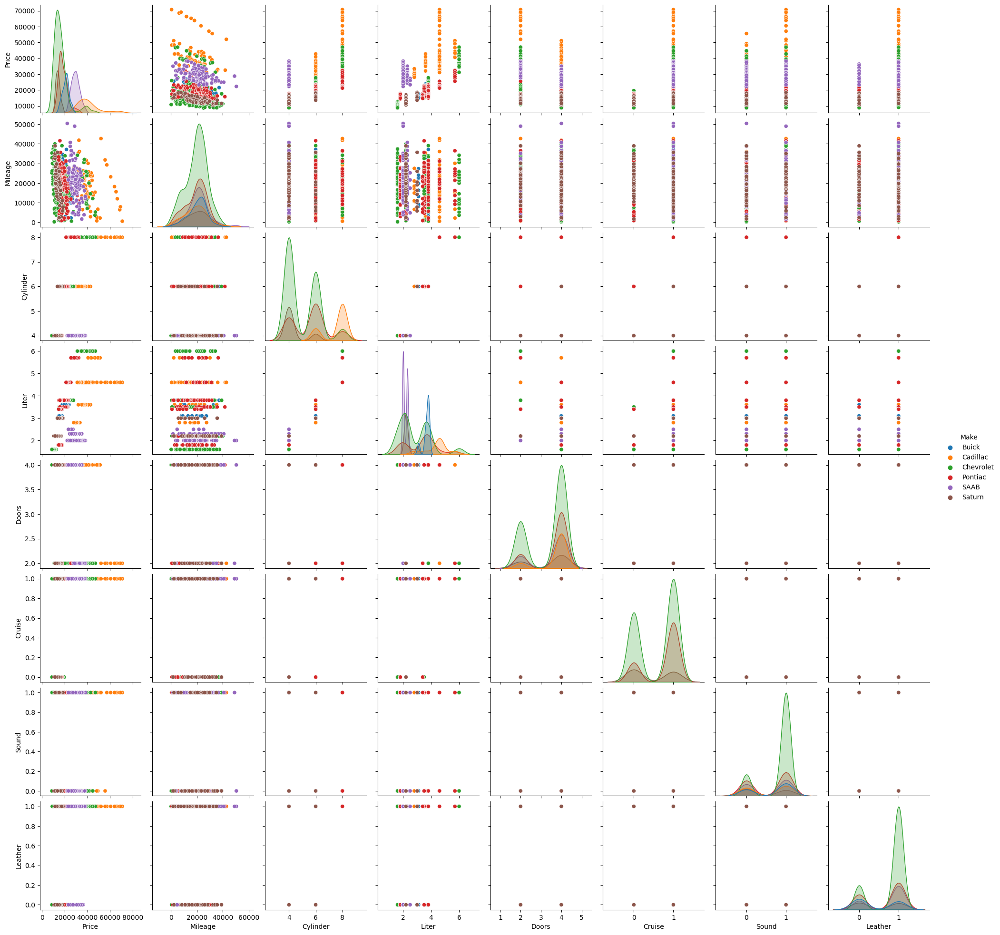

In [93]:
sns.pairplot(df, hue='Make')



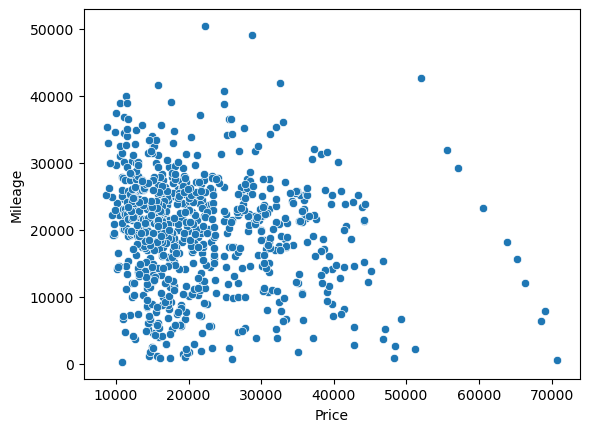

In [94]:
sns.scatterplot(x='Price', y='Mileage', data=df);


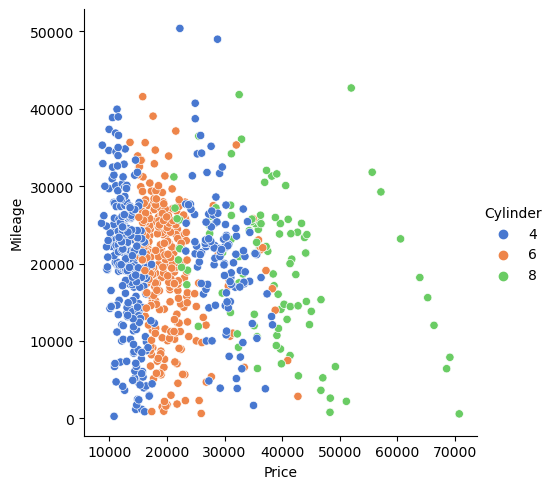

In [95]:
sns.relplot(x='Price', y='Mileage', hue='Cylinder', palette='muted', data=df)

h0: car's price is not affected by the milage
h1. car's price is affected by the milage

In [55]:
from scipy.stats import ttest_ind

In [57]:
t,p=ttest_ind(df.Price,df.Mileage)
p

0.0008662338227446262

since p<0.05 we reject null hypothesis and accept alternative

<Axes: xlabel='Price', ylabel='Count'>

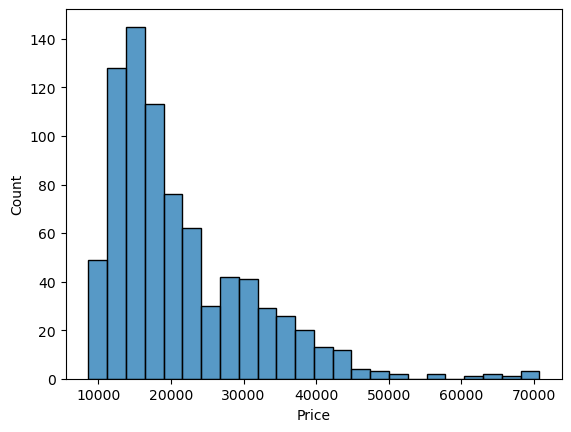

In [59]:
sns.histplot(df.Price)

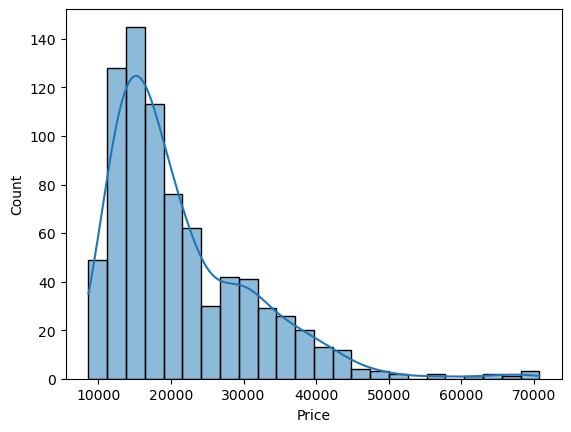

In [61]:
sns.histplot(df.Price, kde=True);

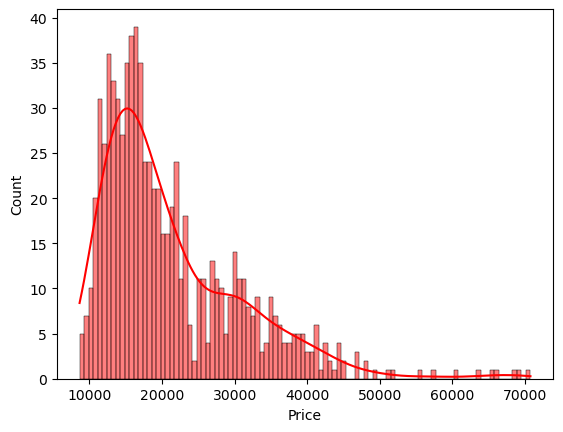

In [65]:
sns.histplot(df.Price, kde=True, color='red', bins=100); #bin means number of bars

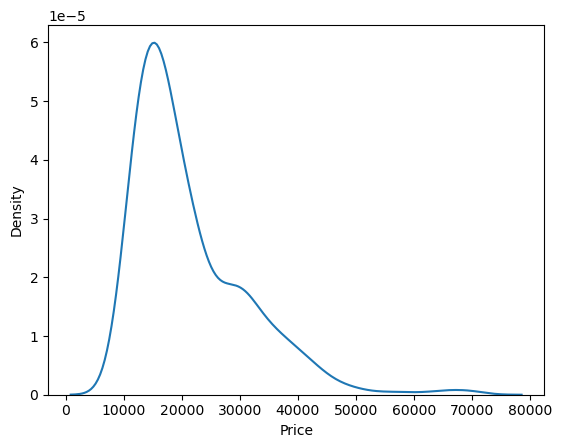

In [66]:
sns.kdeplot(df.Price);

C:\Users\emura\AppData\Local\Temp\ipykernel_19696\191627781.py:1: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(df.Price,fill=True,color='red',shade=True);


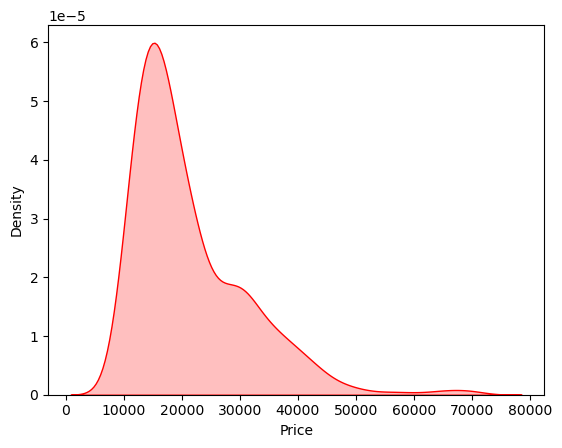

In [67]:
sns.kdeplot(df.Price,fill=True,color='red',shade=True);

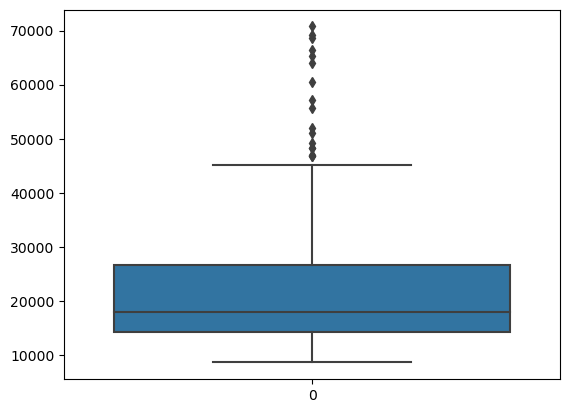

In [68]:
sns.boxplot(df.Price);

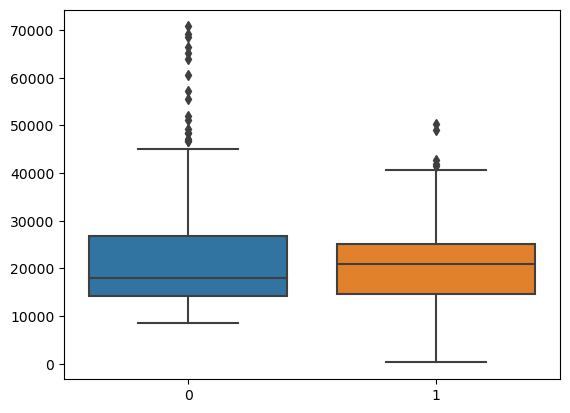

In [70]:
sns.boxplot([df.Price,df.Mileage]);

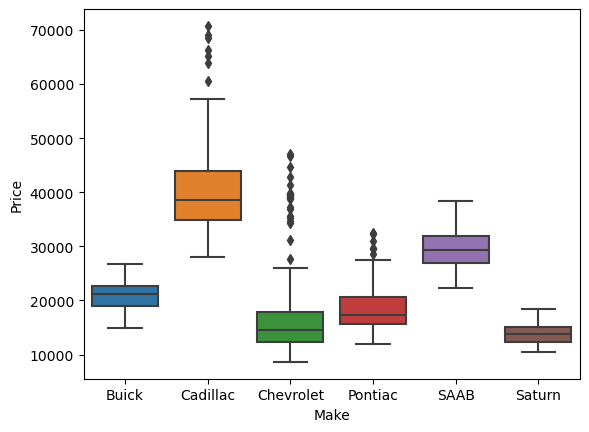

In [76]:
sns.boxplot(x=df.Make, y=df.Price,data=df);


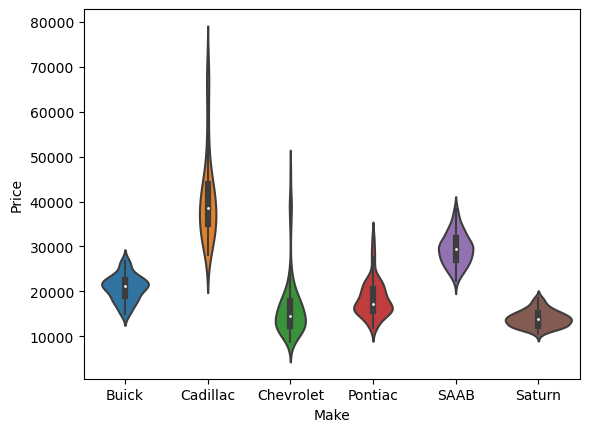

In [77]:
sns.violinplot(x=df.Make, y=df.Price,data=df);

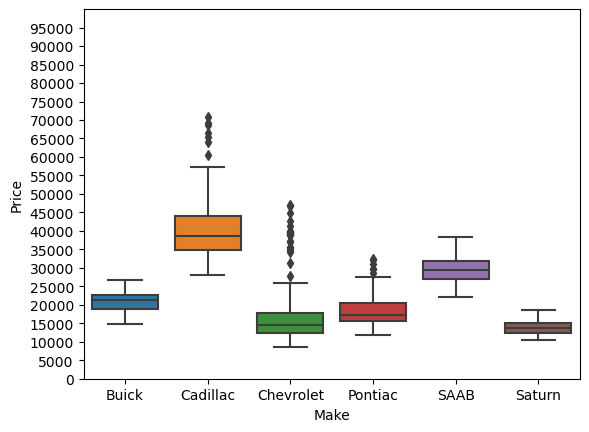

In [81]:
import matplotlib.pyplot as plt 
import numpy as np
sns.boxplot(x=df.Make, y=df.Price,data=df)
plt.yticks(np.arange(0, 100000, 5000))
plt.ylim(0, 100000)
plt.show()

In [82]:
import plotly.express as px

In [83]:
px.bar(df,x="Make",y="Price", color="Make")

In [88]:
px.scatter_3d(df,x="Mileage",y="Price",z="Cylinder", color="Make")

In [89]:
px.sunburst(df,path=["Make", "Model", "Trim"], values="Price",color="Cylinder")

# Feature Engineering

In [96]:
df.corr(numeric_only=True)

,Price,Mileage,Cylinder,Liter,Doors,Cruise,Sound,Leather
Price,1.000000,-0.143051,0.569086,0.558146,-0.138750,0.430851,-0.124348,0.157197
Mileage,-0.143051,1.000000,-0.029461,-0.018641,-0.016944,0.025037,-0.026146,0.001005
Cylinder,0.569086,-0.029461,1.000000,0.957897,0.002206,0.354285,-0.089704,0.075520
Liter,0.558146,-0.018641,0.957897,1.000000,-0.079259,0.377509,-0.065527,0.087332
Doors,-0.138750,-0.016944,0.002206,-0.079259,1.000000,-0.047674,-0.062530,-0.061969
Cruise,0.430851,0.025037,0.354285,0.377509,-0.047674,1.000000,-0.091730,-0.070573
Sound,-0.124348,-0.026146,-0.089704,-0.065527,-0.062530,-0.091730,1.000000,0.165444
Leather,0.157197,0.001005,0.075520,0.087332,-0.061969,-0.070573,0.165444,1.000000


In [97]:
abs(df.corr(numeric_only=True)['Price']).sort_values(ascending=False)

Sound       0.124348
Doors       0.138750
Mileage     0.143051
Leather     0.157197
Cruise      0.430851
Liter       0.558146
Cylinder    0.569086
Price       1.000000
Name: Price, dtype: float64

In [103]:
X=df[['Mileage','Cylinder','Liter','Cruise']] # mielage <.20 but domain info
y=df['Price']

In [117]:
from sklearn.model_selection import train_test_split

In [118]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.2, random_state=42)
#The Hitchhiker's Guide to the Galaxy

In [115]:
x_train.shape,y_train.shape, x_test.shape, y_test.shape

((643, 4), (643,), (161, 4), (161,))

# Modelling

In [120]:
from sklearn.linear_model import LinearRegression

In [121]:
lr=LinearRegression()

In [122]:
model=lr.fit(x_train,y_train) #training

In [123]:
prediction=model.predict(x_test)

In [125]:
from sklearn.metrics import r2_score, mean_squared_error

In [ ]:
#only numeric values

In [139]:
mean_squared_error(y_test,prediction),mean_squared_error(y_test,prediction)**0.5,r2_score(y_test,prediction)

(54956361.439976044, 7413.255792158803, 0.3071114906997998)

# Label Encoding

In [150]:
# Make one hot encoding
X=df[['Mileage','Cylinder','Liter','Cruise','Make','Trim']]
y=df['Price']

In [152]:
X.head()

,Mileage,Cylinder,Liter,Cruise,Make,Trim
0,8221,6,3.1,1,Buick,Sedan 4D
1,9135,6,3.1,1,Buick,Sedan 4D
2,13196,6,3.1,1,Buick,Sedan 4D
3,16342,6,3.1,1,Buick,Sedan 4D
4,19832,6,3.1,1,Buick,Sedan 4D


In [153]:
y.head()

0    17314.103129
1    17542.036083
2    16218.847862
3    16336.913140
4    16339.170324
Name: Price, dtype: float64

In [154]:
X=pd.get_dummies(X,drop_first=True) #get dummies and Delete first column

In [155]:
X.head() #0=False , 1=True

,Mileage,Cylinder,Liter,Cruise,Make_Cadillac,Make_Chevrolet,Make_Pontiac,Make_SAAB,Make_Saturn,Trim_Aero Conv 2D,...,Trim_Quad Coupe 2D,Trim_SE Sedan 4D,Trim_SLE Sedan 4D,Trim_SS Coupe 2D,Trim_SS Sedan 4D,Trim_SVM Hatchback 4D,Trim_SVM Sedan 4D,Trim_Sedan 4D,Trim_Special Ed Ultra 4D,Trim_Sportwagon 4D
0,8221,6,3.1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,9135,6,3.1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,13196,6,3.1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,16342,6,3.1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4,19832,6,3.1,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [163]:
X.columns

Index(['Mileage', 'Cylinder', 'Liter', 'Cruise', 'Make_Cadillac',
       'Make_Chevrolet', 'Make_Pontiac', 'Make_SAAB', 'Make_Saturn',
       'Trim_Aero Conv 2D', 'Trim_Aero Sedan 4D', 'Trim_Aero Wagon 4D',
       'Trim_Arc Conv 2D', 'Trim_Arc Sedan 4D', 'Trim_Arc Wagon 4D',
       'Trim_CX Sedan 4D', 'Trim_CXL Sedan 4D', 'Trim_CXS Sedan 4D',
       'Trim_Conv 2D', 'Trim_Coupe 2D', 'Trim_Custom Sedan 4D',
       'Trim_DHS Sedan 4D', 'Trim_DTS Sedan 4D', 'Trim_GT Coupe 2D',
       'Trim_GT Sedan 4D', 'Trim_GT Sportwagon', 'Trim_GTP Sedan 4D',
       'Trim_GXP Sedan 4D', 'Trim_Hardtop Conv 2D', 'Trim_L300 Sedan 4D',
       'Trim_LS Coupe 2D', 'Trim_LS Hatchback 4D', 'Trim_LS MAXX Hback 4D',
       'Trim_LS Sedan 4D', 'Trim_LS Sport Coupe 2D', 'Trim_LS Sport Sedan 4D',
       'Trim_LT Coupe 2D', 'Trim_LT Hatchback 4D', 'Trim_LT MAXX Hback 4D',
       'Trim_LT Sedan 4D', 'Trim_Limited Sedan 4D', 'Trim_Linear Conv 2D',
       'Trim_Linear Sedan 4D', 'Trim_Linear Wagon 4D', 'Trim_MAXX Hback 

In [164]:
type_dummy=pd.get_dummies(df['Type'],drop_first=True)
type_dummy

,Coupe,Hatchback,Sedan,Wagon
0,0,0,1,0
1,0,0,1,0
2,0,0,1,0
3,0,0,1,0
4,0,0,1,0
...,...,...,...,...
799,0,0,1,0
800,0,0,1,0
801,0,0,1,0
802,0,0,1,0


In [156]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.2, random_state=42)

In [157]:
lr=LinearRegression()

In [158]:
lr.fit(x_train,y_train)

LinearRegression()

In [159]:
prediction=lr.predict(x_test)

In [160]:
mean_squared_error(y_test,prediction),mean_squared_error(y_test,prediction)**0.5,r2_score(y_test,prediction)

(2321452.8651234526, 1523.631472871131, 0.9707311770106378)

In [162]:
#save model with joblib
import joblib
joblib.dump(lr,"model.pkl")

['model.pkl']

In [ ]:
#get car's description and streamlite it

In [161]:
pip install streamlite

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\programdata\anaconda3\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
ERROR: Could not find a version that satisfies the requirement streamlite (from versions: none)
ERROR: No matching distribution found for streamlite


pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [196]:
pip install gradio

Defaulting to user installation because normal site-packages is not writeable
  Using cached pydantic-2.6.1-py3-none-any.whl.metadata (83 kB)
Using cached pydantic-2.6.1-py3-none-any.whl (394 kB)
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.10.14
    Uninstalling pydantic-1.10.14:
      Successfully uninstalled pydantic-1.10.14
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: Loading egg at c:\programdata\anaconda3\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
  You can safely remove it manually.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gradientai 1.7.0 requires pydantic<2.0.0,>=1.10.5, but you have pydantic 2.6.1 which is incompatible.
anaconda-cloud-auth 0.1.4 requires pydantic<2.0, but you have pydantic 2.6.1 which is incompatible.


In [197]:
import gradio as gr
import joblib
import pandas as pd
import numpy as np

# Modeli yükleyin
model = joblib.load("model.pkl")

def predict_price(Mileage, Cylinder, Liter, Cruise, Make, Trim):
    # Boş bir DataFrame oluştur
    input_data = np.zeros(len(model.feature_names_in_))
    features_df = pd.DataFrame([input_data], columns=model.feature_names_in_)
    features_df['Mileage'] = Mileage
    features_df['Cylinder'] = Cylinder
    features_df['Liter'] = Liter
    features_df['Cruise'] = Cruise
    # Make ve Trim için one-hot encoding
    features_df[f"Make_{Make}"] = 1
    
    # Trim sütunlarını ayarla
    for column in features_df.columns:
        if column.startswith("Trim_"):
            features_df[column] = 0
    features_df[f"Trim_{Trim}"] = 1
    
    # Model tahminini yap
    prediction = model.predict(features_df)
    return f"Estimated Price: ${prediction[0]:,.2f}"

# Gradio arayüzünü oluştur
iface = gr.Interface(fn=predict_price,
                     inputs=[
                         gr.Number(label="Mileage"),
                         gr.Number(label="Cylinder", step=1),
                         gr.Number(label="Liter"),
                         gr.Radio(label="Cruise", options=[0, 1]),
                         gr.Dropdown(label="Make", choices=["Cadillac", "Chevrolet", "Pontiac", "SAAB", "Saturn"]),
                         gr.Dropdown(label="Trim", choices=[
                             "Aero Conv 2D", "Aero Sedan 4D", "Aero Wagon 4D",
                             "Arc Conv 2D", "Arc Sedan 4D", "Arc Wagon 4D",
                             "CX Sedan 4D", "CXL Sedan 4D", "CXS Sedan 4D",
                             "Conv 2D", "Coupe 2D", "Custom Sedan 4D",
                             "DHS Sedan 4D", "DTS Sedan 4D", "GT Coupe 2D",
                             "GT Sedan 4D", "GT Sportwagon", "GTP Sedan 4D",
                             "GXP Sedan 4D", "Hardtop Conv 2D", "L300 Sedan 4D",
                             "LS Coupe 2D", "LS Hatchback 4D", "LS MAXX Hback 4D",
                             "LS Sedan 4D", "LS Sport Coupe 2D", "LS Sport Sedan 4D",
                             "LT Coupe 2D", "LT Hatchback 4D", "LT MAXX Hback 4D",
                             "LT Sedan 4D", "Limited Sedan 4D", "Linear Conv 2D",
                             "Linear Sedan 4D", "Linear Wagon 4D", "MAXX Hback 4D",
                             "Quad Coupe 2D", "SE Sedan 4D", "SLE Sedan 4D",
                             "SS Coupe 2D", "SS Sedan 4D", "SVM Hatchback 4D",
                             "SVM Sedan 4D", "Sedan 4D", "Special Ed Ultra 4D",
                             "Sportwagon 4D"
                         ]),
                     ],
                     outputs=[gr.Text(label="Estimated Price")],
                     title="Car Price Prediction",
                     description="Enter the car details and get the estimated price.")

# Arayüzü başlat
iface.launch()


ImportError: cannot import name 'RootModel' from 'pydantic' (C:\Users\emura\AppData\Roaming\Python\Python311\site-packages\pydantic\__init__.cp311-win_amd64.pyd)

In [168]:
from sklearn.linear_model import Ridge, Lasso, ElasticNet

In [169]:
r=Ridge()
l=Lasso()
e=ElasticNet()

In [170]:
r_model=r.fit(x_train,y_train)

In [171]:
prediction_rmodel=r_model.predict(x_test)

In [172]:
r2_score(y_test,prediction_rmodel)

0.9686973810318731

In [174]:
l_model=l.fit(x_train,y_train)

In [175]:
prediction_lmodel=l_model.predict(x_test)
r2_score(y_test,prediction_lmodel)

0.9705999564419019

In [176]:
emodel=e.fit(x_train,y_train)

In [178]:
prediction_emodel=emodel.predict(x_test)
r2_score(y_test,prediction_emodel)

0.558714578586518

In [182]:
def model_score(model_name,x_train, y_train, x_test, y_test):
    '''
    about function:
    model_name: model name
    LinearRegression, Ridge, Lasso, ElasticNet
    x_train: train data
    y_train: train target
    x_test: test data
    y_test: test target
    '''
    if model_name == "LinearRegression":
        model = LinearRegression()
    elif model_name == "Ridge":
        model = Ridge()
    elif model_name == "Lasso":
        model = Lasso()
    elif model_name == "ElasticNet":
        model = ElasticNet()
    model.fit(x_train, y_train)
    prediction = model.predict(x_test)
    score = r2_score(y_test, prediction)
    return score

In [187]:
for model in ["LinearRegression", "Ridge", "Lasso", "ElasticNet"]:
    print(model,model_score(model, x_train, y_train, x_test, y_test))

LinearRegression 0.9707311770106378
Ridge 0.9686973810318731
Lasso 0.9705999564419019
ElasticNet 0.558714578586518


In [206]:
from sklearn.ensemble import ExtraTreesRegressor
et=ExtraTreesRegressor()

In [207]:
et_model=et.fit(x_train,y_train)
prediction_etmodel=et_model.predict(x_test)
r2_score(y_test,prediction_etmodel)

0.9898610458461543

In [188]:
#Coefficients
lr.coef_

array([-1.98809431e-01, -2.60219053e+03,  7.38331957e+03, -1.05024563e+02,
        1.55364461e+04, -2.81688090e+03, -3.59594608e+03,  6.85100028e+03,
       -2.29878609e+03,  3.90588224e+03, -2.64773527e+03, -1.26995361e+03,
        7.05993990e+03, -2.22310734e+02,  1.38127365e+02, -8.04390904e+03,
       -6.79607391e+03, -6.85437716e+03,  3.54018314e+03, -5.72790226e+03,
       -1.11979437e+04, -8.32030557e+03, -7.59431897e+03, -8.10925499e+03,
       -6.53924263e+03, -3.82628105e+02, -5.76220228e+03, -3.63992297e+03,
        1.67584142e+04, -5.32327214e+03, -7.83067529e+03, -4.64523486e+03,
       -7.53303979e+03, -6.65186020e+03, -7.63546793e+03, -6.87040602e+03,
       -6.33606759e+03, -3.92489639e+03, -7.03882417e+03, -6.17480932e+03,
       -8.14421976e+03,  4.52867027e+03, -2.53728086e+03, -2.10433902e+03,
       -7.88530569e+03, -6.07227049e+03, -6.65263910e+03, -5.53516395e+03,
       -4.78023915e+03, -3.13661125e+03, -6.92039280e+03, -5.51518953e+03,
       -7.77024475e+03, -

In [193]:
features_importance=pd.DataFrame(lr.coef_, X.columns, columns=['Coefficients'])
#pd.DataFrame({'Features':X.columns, 'Coefficients':lr.coef_})
features_importance

,Coefficients
Mileage,-0.198809
Cylinder,-2602.190533
Liter,7383.319566
Cruise,-105.024563
Make_Cadillac,15536.446130
Make_Chevrolet,-2816.880903
Make_Pontiac,-3595.946075
Make_SAAB,6851.000276
Make_Saturn,-2298.786085
Trim_Aero Conv 2D,3905.882237


In [192]:
features_importance.sort_values(by="Coefficients")

,Coefficients
Trim_Custom Sedan 4D,-11197.943729
Trim_DHS Sedan 4D,-8320.305567
Trim_Limited Sedan 4D,-8144.219762
Trim_GT Coupe 2D,-8109.254993
Trim_CX Sedan 4D,-8043.909039
Trim_MAXX Hback 4D,-7885.305685
Trim_LS Coupe 2D,-7830.675291
Trim_Sedan 4D,-7770.244748
Trim_LS Sport Coupe 2D,-7635.467926
Trim_DTS Sedan 4D,-7594.318973


<Axes: xlabel='Coefficients'>

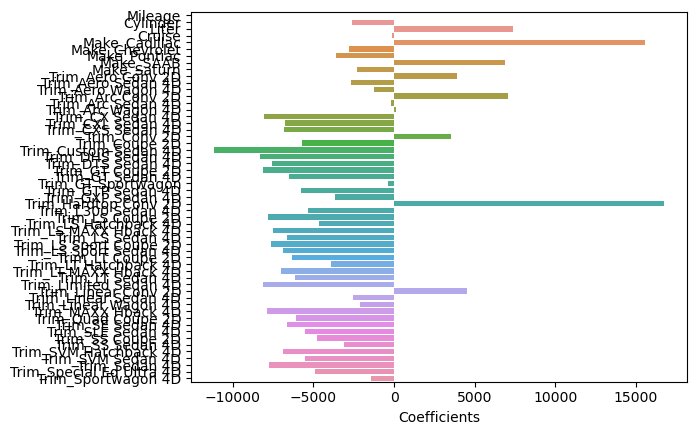

In [191]:
sns.barplot(x="Coefficients", y=features_importance.index, data=features_importance, orient='h')

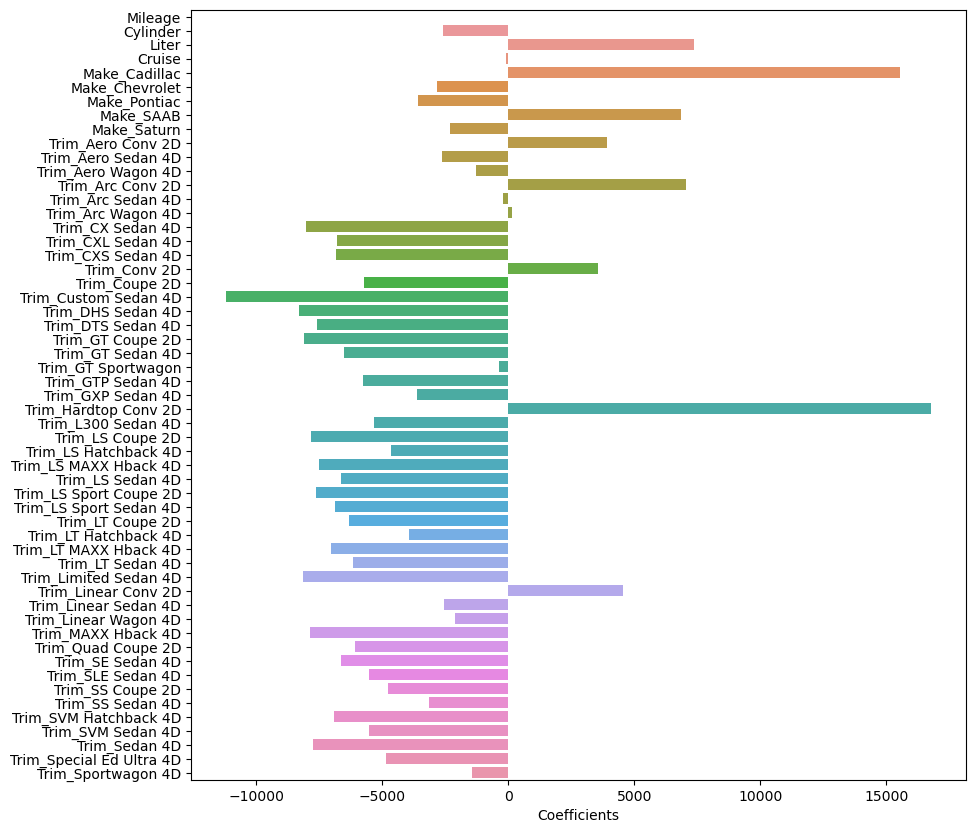

In [194]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
sns.barplot(x="Coefficients", y=features_importance.index, data=features_importance, orient='h')
plt.show()

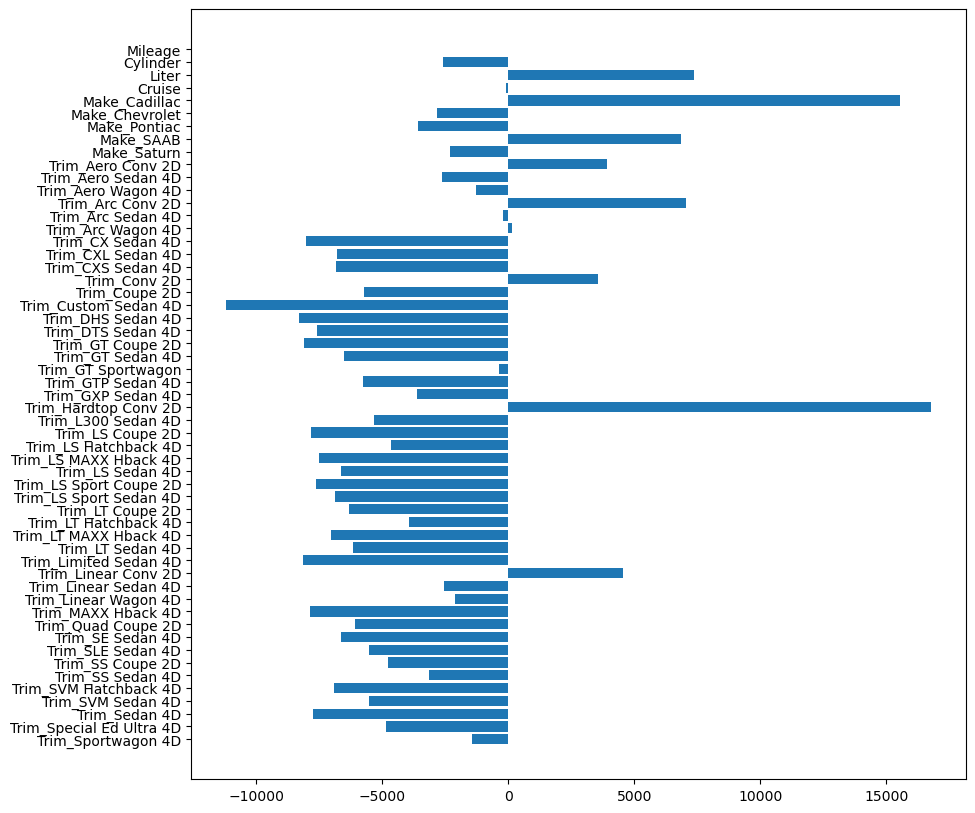

In [199]:
plt.figure(figsize=(10, 10))
plt.barh(features_importance.index, features_importance["Coefficients"])
plt.gca().invert_yaxis()
plt.show()

# Regression success
    1- R2_score>0.85
    2- Low RMSE
    3- Residuals should follow normal distrubition

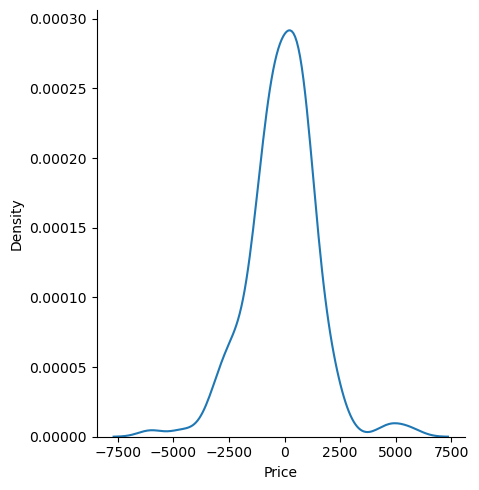

In [202]:
residuals=prediction_lmodel-y_test
sns.displot(residuals, kind="kde")

<Axes: xlabel='Price', ylabel='Count'>

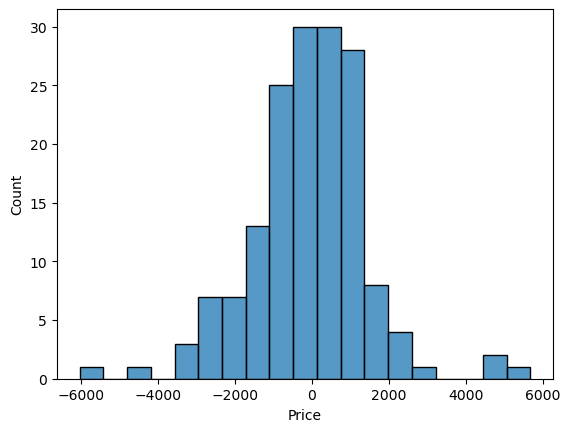

In [204]:
residuals=prediction_lmodel-y_test
sns.histplot(residuals)

In [205]:
#test normal distribution
from scipy import stats
stats.shapiro(residuals)

ShapiroResult(statistic=0.9554204344749451, pvalue=5.136999243404716e-05)